In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
from scipy.ndimage import binary_opening
from skimage.morphology import square
from skimage import filters
from zipfile import ZipFile
from tabulate import tabulate

In [28]:

base_dir = r'C:\Users\hassa\OneDrive\Desktop\cap_counter\data'
folders = ['N1', 'N2', 'S2', 'S3']
non_natif_images = []
for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    for file in os.listdir(folder_path):
        if '_Natif' not in file:
            file_path = os.path.join(folder_path, file)
            non_natif_images.append(file_path)
print("All non-natif images path is stored in the list successfully!")
print(non_natif_images)


image_mapping = {}
images = []
"""
Below lines of code will associate each non-natif image to the corresponding natif image in the given dataset.
For this we first add all the images to an empty list, and then we add the non-natif images as key and natif images as values into a dictionary
"""
for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    for file in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file)
        images.append(file_path)
        if '_Natif' in file_path:
            non_natif_path = file_path.replace('_Natif', '')
            image_mapping[non_natif_path] = file_path  # This mapping allows us to easily associate Natif and non-Natif versions of the same image.
print("Images are associated successfully!")
print(image_mapping)


All non-natif images path is stored in the list successfully!
['C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N1\\N1a.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N1\\N1b.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N1\\N1c.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N1\\N1d.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N1\\N1e.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N1\\N1f.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N1\\N1g.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N1\\N1h.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N1\\N1i.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N1\\N1j.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N2\\N2b.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N2\\N2c.jpg', 'C:\\Users\\hassa\\OneDrive\\Desktop\\cap_counter\\data\\N2\\N2d.jpg', 'C:\\Users\\ha

In [29]:
def rotate_to_horizontal(image, line_angle):
    rotation_angle = 90+line_angle
    center = (image.shape[1] // 2, image.shape[0] // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, rotation_angle, 1)
    rotated_image = cv2.warpAffine(image, rotation_matrix, (image.shape[1], image.shape[0])) # This function applies the rotation to the image using the rotation matrix. It returns the rotated image.
    return rotated_image, rotation_matrix

def get_roi(image, line, image_path):
    x1, y1, x2, y2 = line[0]
    start = min(x1, x2)
    end = max(x1, x2)
    y_line = min(y1, y2)

    if os.path.basename(image_path).startswith(('S2', 'S3')):
        height = 150
    else:
        height = 210

    if y_line < height:
        height -= 10
        if y_line < height:
            print("Even though adjustments are made, still the line is too close to the edge.")
            return None
    roi = image[y_line-height:y_line, start-20:end+20] # Extract the ROI from the image based on the adjusted height, starting, and ending coordinates of the line.
    return roi

def calculate_luminance(image):
    luminance = image.mean() # This calculates the mean value of all the pixel intensities in the image, which represents the luminance level.
    return luminance

def slope_and_distance(contour1, contour2):
    M1 = cv2.moments(contour1)
    M2 = cv2.moments(contour2)

    cX1 = int(M1["m10"] / M1["m00"])
    cY1 = int(M1["m01"] / M1["m00"])

    cX2 = int(M2["m10"] / M2["m00"])
    cY2 = int(M2["m01"] / M2["m00"])

    slope = (cY2 - cY1) / (cX2 - cX1)
    distance = np.sqrt((cX2 - cX1)**2 + (cY2 - cY1)**2)

    return slope, distance

def is_horizontal(contour):
    if len(contour) < 5: 
        return False
    _, _, angle = cv2.fitEllipse(contour)
    return abs(angle - 90) < 15  

def is_tubular(contour):
    area = cv2.contourArea(contour)
    length = cv2.arcLength(contour, True)
    return area / length > 0.5
distance_threshold = 20.0

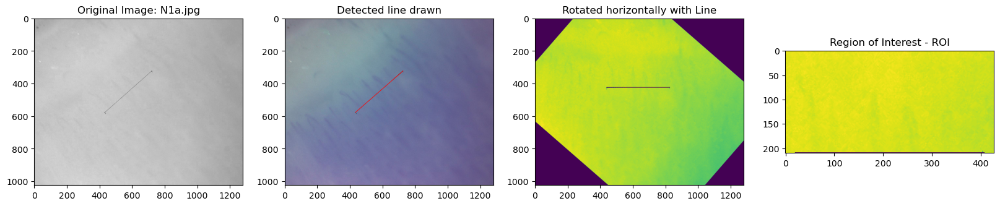

In [30]:
transformation_info = {}

for image_path in images:
    if '_Natif' in image_path:
        continue
    bgr_image = cv2.imread(image_path) # reading the image
    rgb_image = cv2.cvtColor(bgr_image,cv2.COLOR_BGR2RGB) # converting to RGB format
    red_image = bgr_image[:,:,2] # extracting only the red channel

    canny_min_threshold=30
    canny_max_threshold=90

    hough_rho=1
    hough_theta=np.pi / 180
    hough_threshold=100
    hough_min_line_length=100
    hough_max_line_gap=100

    blurred = cv2.GaussianBlur(red_image, (5,5), 0) # Applying Gaussian Blur to smoothened the image
    edges = cv2.Canny(blurred, canny_min_threshold, canny_max_threshold) # Applyinh Canny Edge detector to detect edges
    lines = cv2.HoughLinesP(edges, hough_rho, hough_theta, hough_threshold, minLineLength=hough_min_line_length, maxLineGap=hough_max_line_gap) # Applying Probabilistic Hough Line Transform to detect lines.

    if lines is None:
        continue

    longest_line = max(lines, key=lambda line: np.sqrt((line[0][2]-line[0][0])**2 + (line[0][3]-line[0][1])**2))
    longest_line_img = np.copy(bgr_image).astype(np.uint8)
    cv2.line(longest_line_img, (longest_line[0][0], longest_line[0][1]), (longest_line[0][2], longest_line[0][3]), (255,0,0), 2)

# dx and dy calculate the change in x and y coordinates between the endpoints of the line.
    dx = longest_line[0][2] - longest_line[0][0]
    dy = longest_line[0][3] - longest_line[0][1]

    if dx != 0:
        slope = dy / dx
    else:
        slope = np.inf

    angle = np.degrees(np.arctan(slope)) # calculating the angle of the line

    if dx < 0:
        angle += 180

    angle -= 90

    rotated_image, rotation_matrix = rotate_to_horizontal(red_image, angle) # get the rotated image
    points = np.float32([[longest_line[0][0], longest_line[0][1]], [longest_line[0][2], longest_line[0][3]]]).reshape(-1, 1, 2) # this applies the rotation matrix to the points to transform them to the rotated image.
    transformed_points = cv2.transform(points, rotation_matrix) # this contains the transformed endpoints of the longest line in the rotated image.
    transformed_line = transformed_points.reshape(-1, 4).astype(int)

    roi = get_roi(rotated_image, transformed_line,image_path) # extract the region of interest from the rotated image

    if roi is not None:
        filename = os.path.basename(image_path) # getting file name of each image

        fig, ax = plt.subplots(1, 4, figsize=(20, 10))

        ax[0].imshow(red_image, cmap='gray')
        ax[0].set_title(f"Original Image: {filename}")

        ax[1].imshow(longest_line_img)
        ax[1].set_title("Detected line drawn")

        cv2.line(rotated_image, (transformed_line[0][0], transformed_line[0][1]), (transformed_line[0][2], transformed_line[0][3]), (0,0,255), 2)
        ax[2].imshow(rotated_image)
        ax[2].set_title("Rotated horizontally with Line")

        ax[3].imshow(roi)
        ax[3].set_title("Region of Interest - ROI")

        plt.show()
        break

    # image_path is used as the key for the transformation_info dictionary, (angle, transformed_line) is a tuple containing:
    # 1. The angle of rotation applied to the image. 2. The coordinates of the longest line after transformation.
    transformation_info[image_path] = (angle, transformed_line)

Luminance for N1a_Natif.jpg: 140.31895861148197


C:\Users\hassa\AppData\Local\Temp\ipykernel_13108\3307908505.py:33: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  dilated1 = binary_opening(thresh_image, square(4))


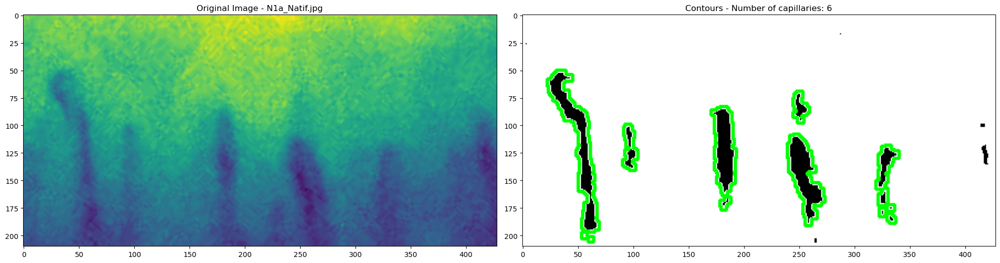

Luminance for N1b_Natif.jpg: 124.45440251572327


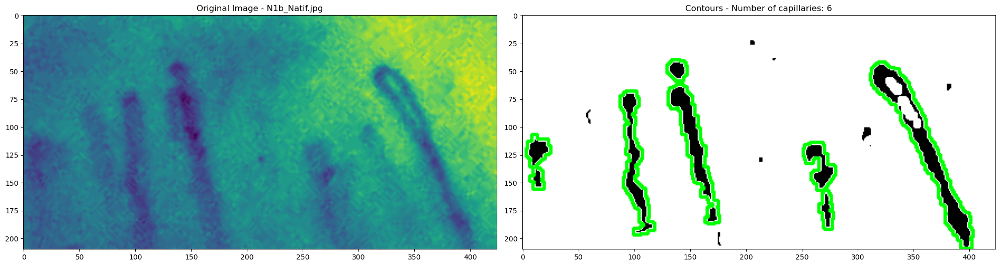

Luminance for N1c_Natif.jpg: 129.32971472971474


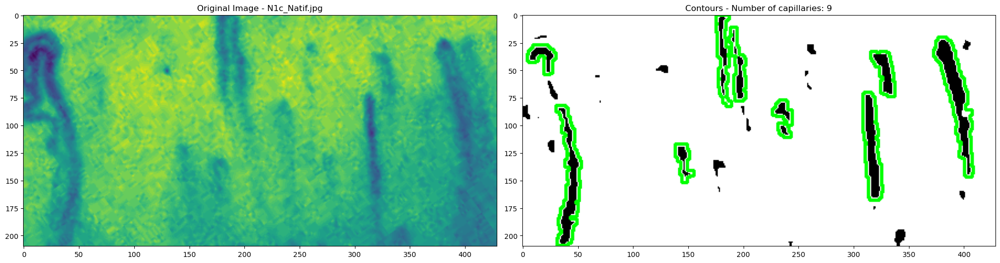

Luminance for N1d_Natif.jpg: 122.2790962324605


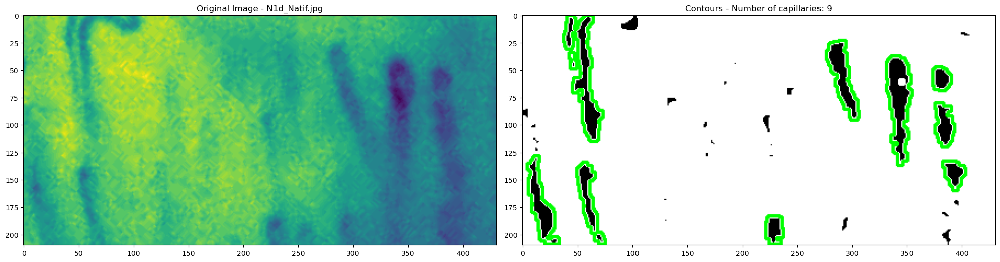

Luminance for N1e_Natif.jpg: 92.77546728971963


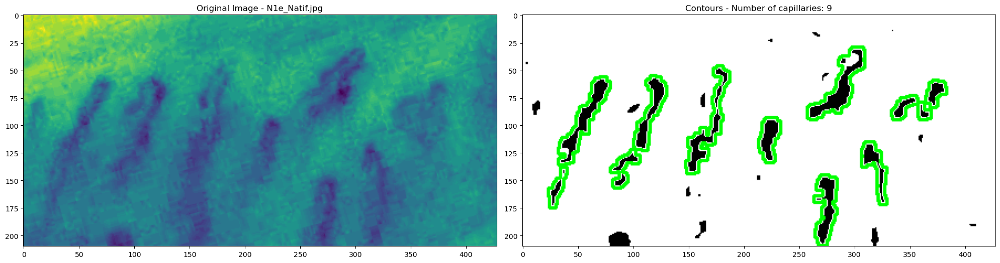

Luminance for N1f_Natif.jpg: 106.24488680718189


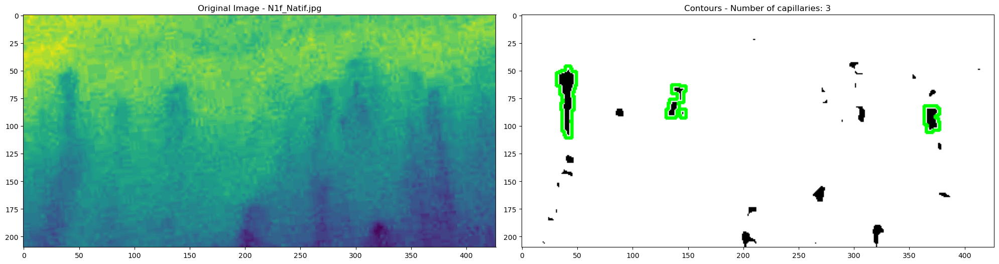

Luminance for N1g_Natif.jpg: 106.24488680718189


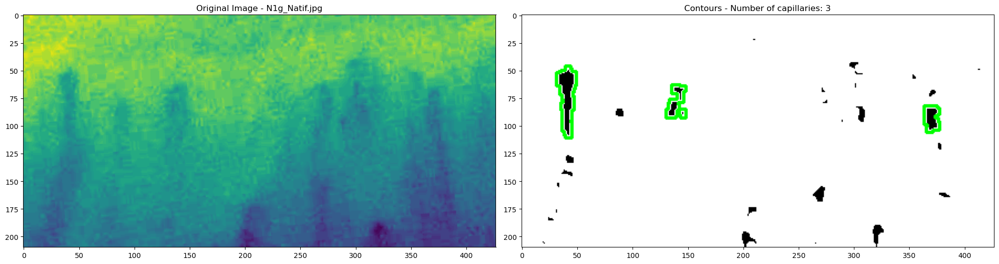

Luminance for N1h_Natif.jpg: 117.47670226969292


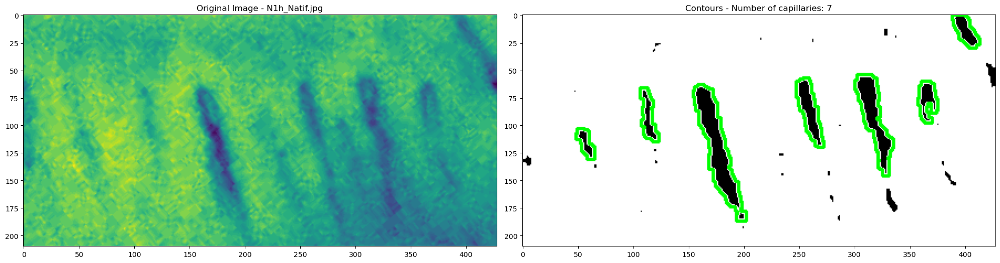

Luminance for N1i_Natif.jpg: 96.94611054823821


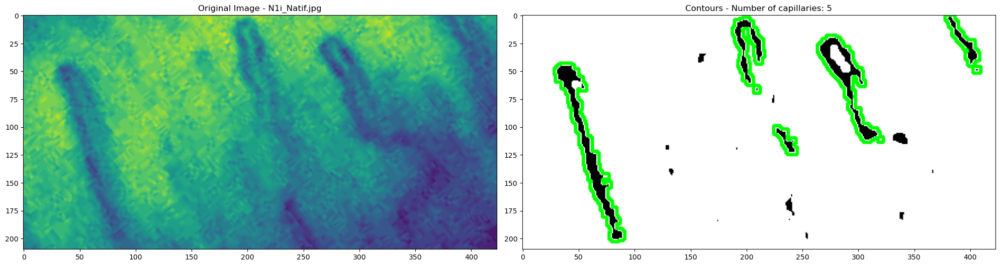

Luminance for N1j_Natif.jpg: 102.9302330768373


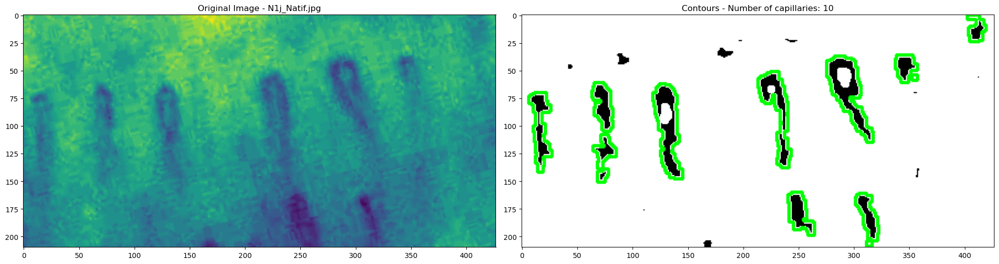

Luminance for N2b_Natif.jpg: 65.20931092436975


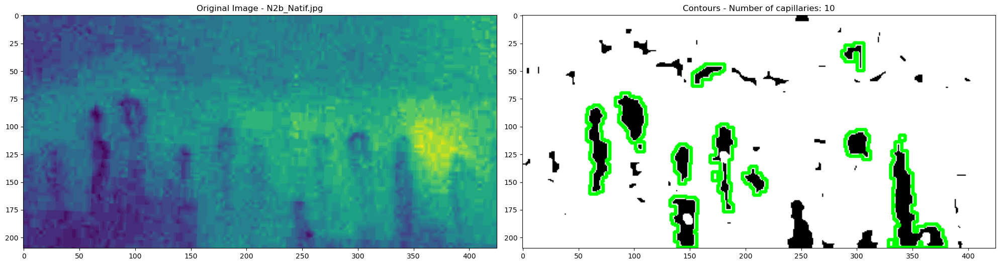

Luminance for N2c_Natif.jpg: 79.304918767507


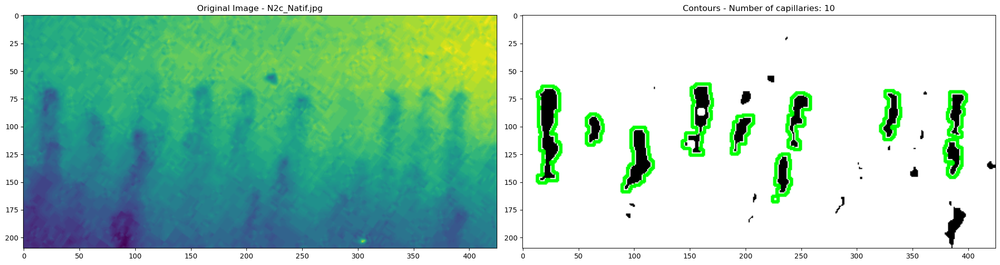

Luminance for N2d_Natif.jpg: 74.48587114845938


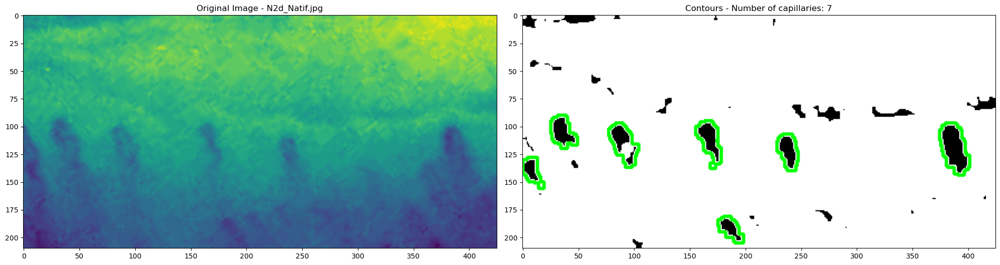

Luminance for S2a_Natif.jpg: 199.916647763075


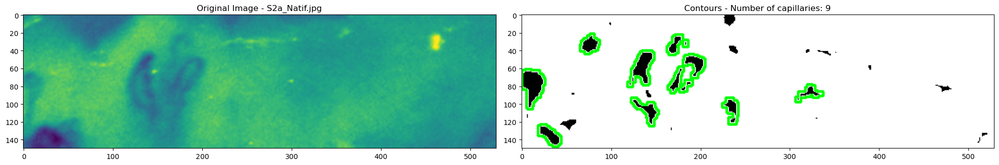

Luminance for S2b_Natif.jpg: 215.3713411764706


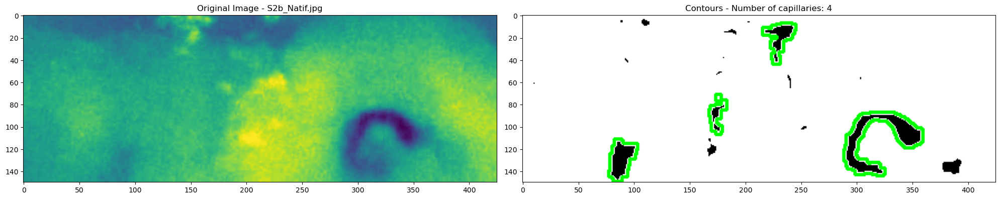

Luminance for S2c_Natif.jpg: 216.0042211838006


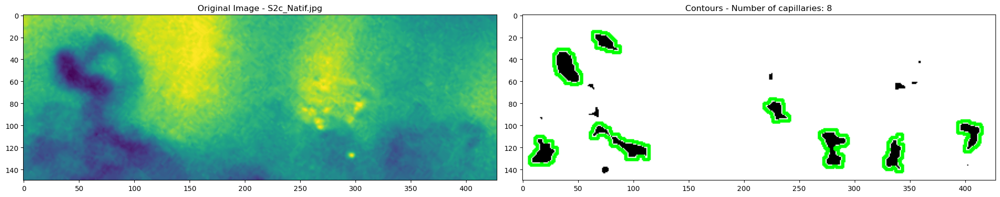

Luminance for S2d_Natif.jpg: 154.7172429906542


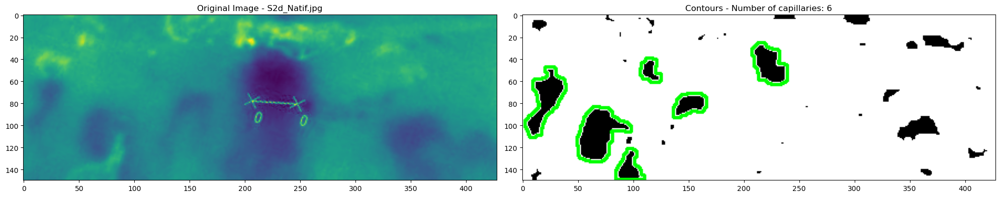

Luminance for S2e_Natif.jpg: 202.81243410852713


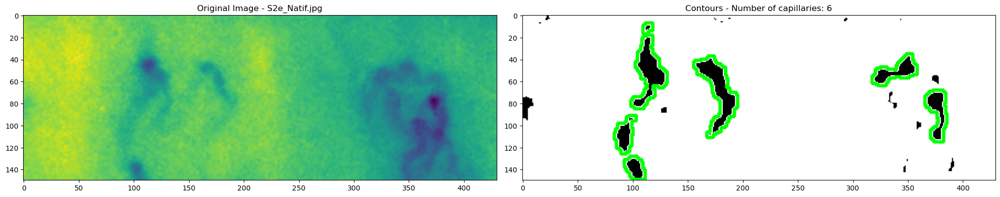

Luminance for S2f_Natif.jpg: 208.723738317757


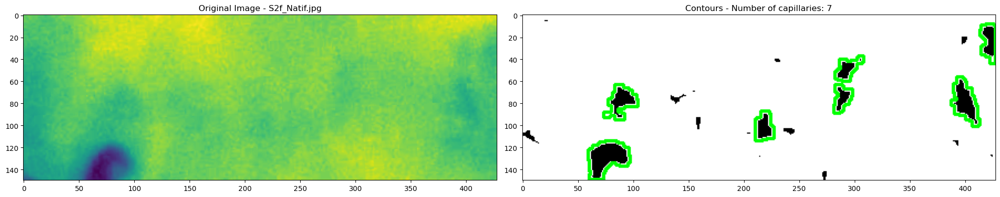

Luminance for S2g_Natif.jpg: 190.15570190641247


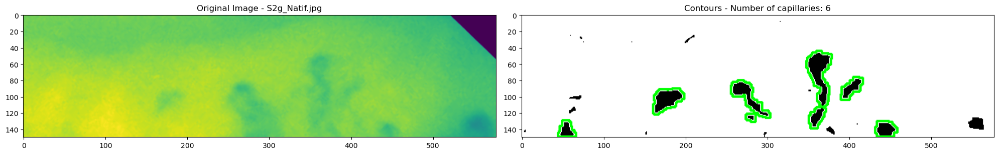

Luminance for S3a_Natif.jpg: 93.61842592592592


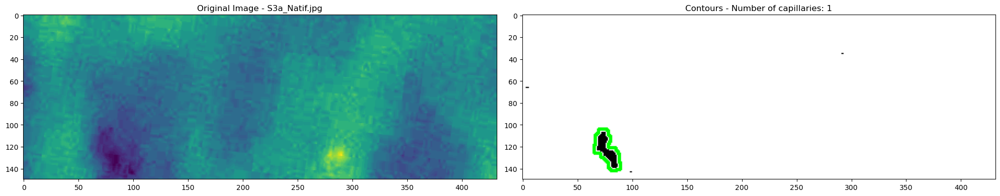

Luminance for S3b_Natif.jpg: 87.89428571428572


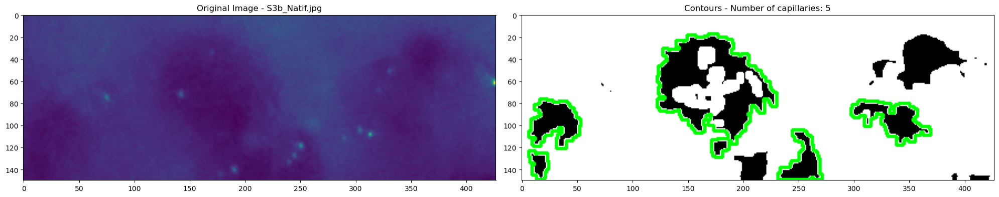

Luminance for S3c_Natif.jpg: 77.30490980392157


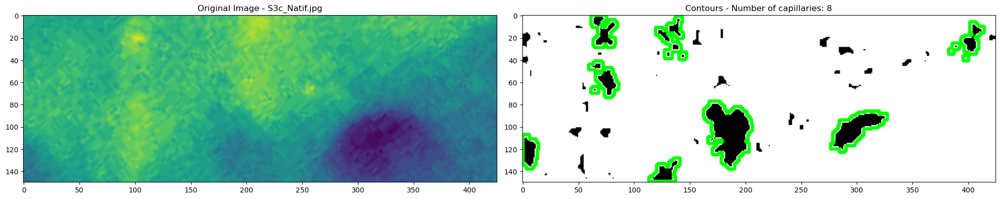

Luminance for S3d_Natif.jpg: 84.11290409121395


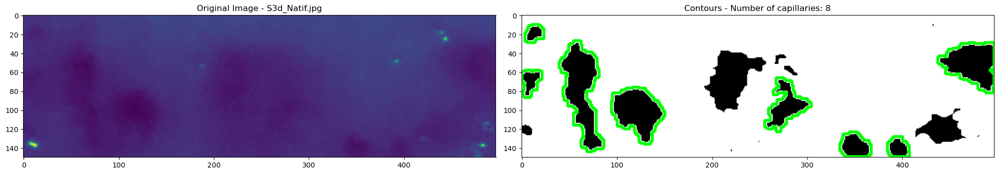

Luminance for S3e_Natif.jpg: 69.29388364779874


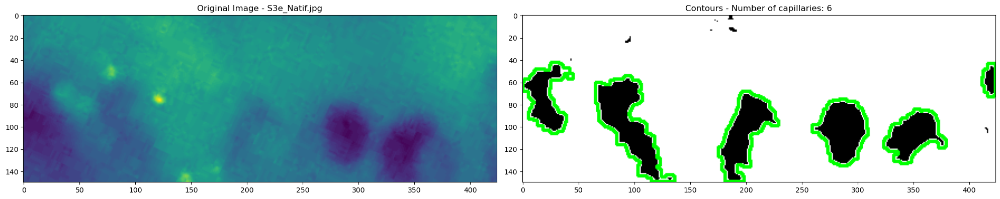

Luminance for S3f_Natif.jpg: 83.97275430359937


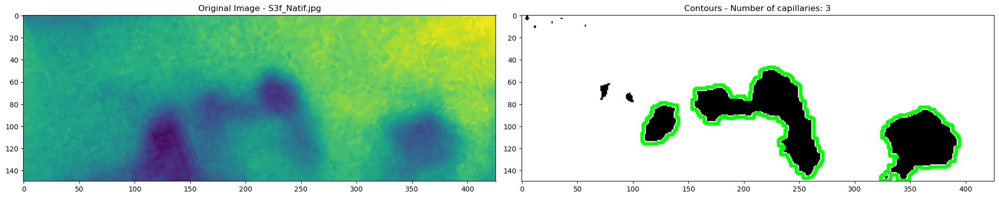

Luminance for S3g_Natif.jpg: 64.5097641509434


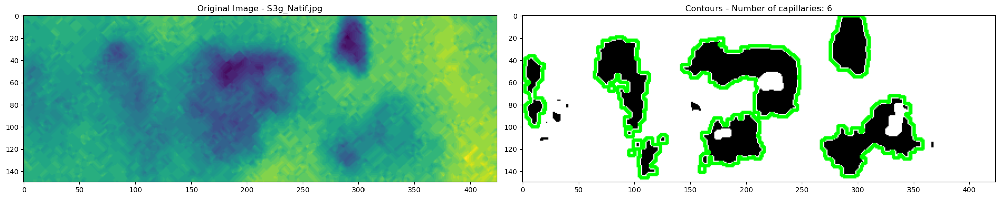

Luminance for S3h_Natif.jpg: 50.62246855345912


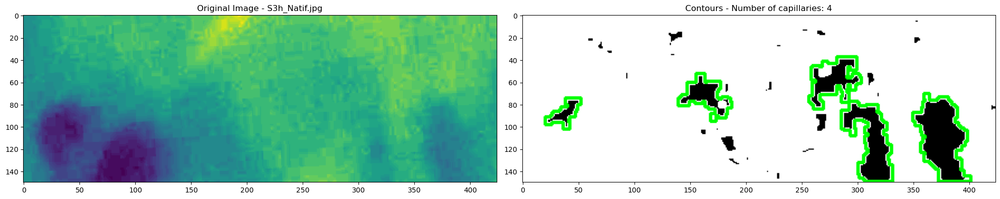

Luminance for S3i_Natif.jpg: 73.83778301886792


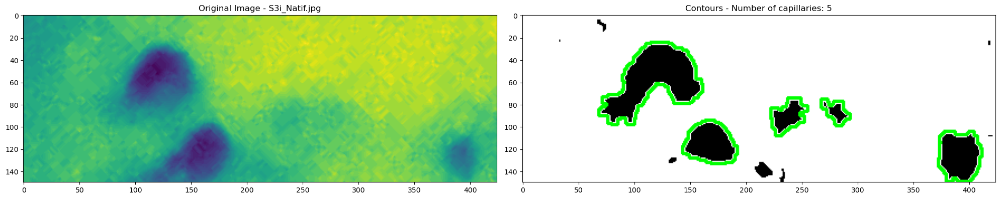

Luminance for S3j_Natif.jpg: 76.04245283018868


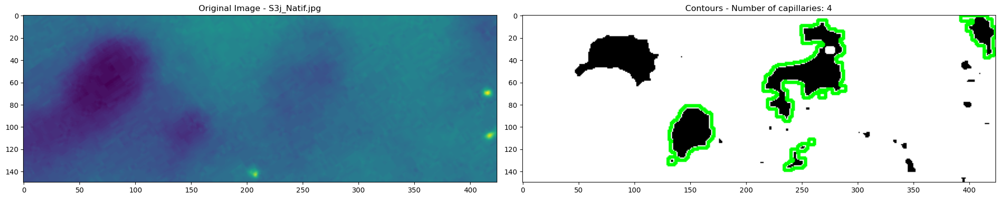

In [13]:
def process_images(images, image_paths):
    results = {} # # Dictionary to store the results

    # Iterate through both images and image_paths simultaneously.
    for idx, (img, image_path) in enumerate(zip(images, image_paths)):
        low = 60
        high = 90

        # Calculate Luminance for each Image
        luminance = calculate_luminance(img)
        print(f'Luminance for {os.path.basename(image_path)}: {luminance}')

        # apply histogram equalization, CLAHE (Contrast Limited Adaptive Histogram Equalization),
        # and adaptive thresholding with Gaussian blur.
        if luminance < 88:
            equ = cv2.equalizeHist(img)
            clahe = cv2.createCLAHE(clipLimit=5, tileGridSize=(6,6))
            clahe_roi = clahe.apply(equ)
            thresh_image = cv2.adaptiveThreshold(equ,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,125,20)
        else:
            equ = cv2.equalizeHist(img)
            clahe = cv2.createCLAHE(clipLimit=20.0, tileGridSize=(6,6))
            clahe_roi = clahe.apply(img)
            thresh_image = cv2.adaptiveThreshold(clahe_roi,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV,125,50)

        """
        Performed various morphological operations to enhance capillary structures:
        1. Binary opening and dilation.
        2. Hysteresis thresholding.
        3. Dilation and erosion.
        4. Morphological closing and opening.
        """
        dilated1 = binary_opening(thresh_image, square(4))
        dilated1 = dilated1.astype(np.uint8) * 255

        kernel4 = np.ones((3,3),np.uint8)
        dilation2 = cv2.dilate(dilated1,kernel4 ,iterations = 1)

        kernel7 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7))
        opening1 = binary_opening(dilation2  ,kernel7)
        opening1 = opening1.astype(np.uint8) * 255

        hyst = filters.apply_hysteresis_threshold(~ opening1, low, high)
        opening1 = hyst.astype(np.uint8) * 255
        engorde = cv2.dilate(opening1, kernel7 ,iterations = 1)

        kernel3 = np.ones((5,5),np.uint8)
        erosion = cv2.erode(engorde , kernel3, iterations = 1)

        closed = cv2.morphologyEx(erosion, cv2.MORPH_CLOSE, kernel3)

        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
        opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel)

        kernel_ = np.ones((3,3),np.uint8)
        dilated = cv2.dilate(opened, kernel_, iterations = 2)

        num_labels, labels = cv2.connectedComponents(dilation2) # labeling the connected components in an image
        contour_img = cv2.cvtColor(dilated.copy(), cv2.COLOR_GRAY2BGR)

        capillary_count = 0

        for label in range(1, num_labels):
            component = np.zeros_like(opened)
            component[labels == label] = 255

            # Finding the contours in a binary image
            contours, _ = cv2.findContours(component, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

            # Contours with an area less than min_contour_area are filtered out.
            # Additionally, contours that are horizontal (angle close to 90 degrees) are also discarded.
            min_contour_area = 260
            contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_contour_area and not is_horizontal(cnt)]

            if capillary_count >= 10:
                contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]

            """
            Merging contours helps to avoid counting the same capillary multiple times.
            Two contours are merged if:
            The absolute value of their slope is between 0.5 and 1.5.
            The distance between them is less than distance_threshold.
            """
            merged_contours = []
            for i in range(len(contours)):
                for j in range(i+1, len(contours)):
                    slope, distance = slope_and_distance(contours[i], contours[j])
                    if abs(slope) > 0.5 and abs(slope) < 1.5 and distance < distance_threshold:
                        merged_contours.append(contours[i])
                        break
                else:
                    merged_contours.append(contours[i])

            for contour in merged_contours:
                if is_tubular(contour):
                    capillary_count += 1
                    cv2.drawContours(contour_img, [contour], -1, (0, 255, 0), 2)
                if capillary_count >= 10:
                    break

            if capillary_count >= 10:
                break

        # adding the results data in the "results dictionary"
        image_name = os.path.basename(image_path)
        results[image_name] = capillary_count

        fig, ax = plt.subplots(1, 2, figsize=(20, 10))

        ax[0].imshow(img)
        ax[0].set_title(f'Original Image - {image_name}')

        ax[1].imshow(cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB))
        ax[1].set_title(f'Contours - Number of capillaries: {capillary_count}')

        plt.tight_layout()
        plt.show()

    return results

image_paths = list(image_mapping.values()) # a list containing the paths of both non-natif and natif images
results = process_images(roi_natif_images, image_paths)

**Results**

1. The following table shows the capillaries detected in each Natif Image.

2. Later on, the predicted number of capillaries is compared with the ground truth to figure out the accuracy of the algorithm.

3. Lastly, the ground truth, and predicted data is plotted for better visualization.


In [14]:
headers = ["Image Name", "Density of Capillaries"]
table_data = []
results_sorted = dict(sorted(results.items())) # sorting the data

for image_name, capillary_count in results_sorted.items():
    table_data.append([image_name, capillary_count])

table = tabulate(table_data, headers=headers, tablefmt="grid")
print(table)

+---------------+--------------------------+
| Image Name    |   Density of Capillaries |
+===============+==========================+
| N1a_Natif.jpg |                        6 |
+---------------+--------------------------+
| N1b_Natif.jpg |                        6 |
+---------------+--------------------------+
| N1c_Natif.jpg |                        9 |
+---------------+--------------------------+
| N1d_Natif.jpg |                        9 |
+---------------+--------------------------+
| N1e_Natif.jpg |                        9 |
+---------------+--------------------------+
| N1f_Natif.jpg |                        3 |
+---------------+--------------------------+
| N1g_Natif.jpg |                        3 |
+---------------+--------------------------+
| N1h_Natif.jpg |                        7 |
+---------------+--------------------------+
| N1i_Natif.jpg |                        5 |
+---------------+--------------------------+
| N1j_Natif.jpg |                       10 |
+---------

In [15]:
# a dictionary containing ground truth, and predicted data
ground_truth = {
    'N1a': 6, 'N1b': 7, 'N1c': 9, 'N1d': 8, 'N1e': 8, 'N1f': 9, 'N1g': 9, 'N1h': 7, 'N1i': 7, 'N1j': 8,
    'N2b': 10, 'N2c': 9, 'N2d': 7, 'S2a': 1, 'S2b': 2, 'S2c': 2, 'S2d': 5, 'S2e': 4, 'S2f': 1, 'S2g': 4,
    'S3a': 5, 'S3b': 5, 'S3c': 2, 'S3d': 5, 'S3e': 5, 'S3f': 4, 'S3g': 5, 'S3h': 4, 'S3i': 2, 'S3j': 5
}

predicted_values = {
    'N1a': 6, 'N1b': 6, 'N1c': 9, 'N1d': 9, 'N1e': 9, 'N1f': 3, 'N1g': 3, 'N1h': 7, 'N1i': 5, 'N1j': 10,
    'N2b': 10, 'N2c': 10, 'N2d': 7, 'S2a': 9, 'S2b': 4, 'S2c': 8, 'S2d': 6, 'S2e': 6, 'S2f': 7, 'S2g': 6,
    'S3a': 1, 'S3b': 5, 'S3c': 8, 'S3d': 8, 'S3e': 6, 'S3f': 3, 'S3g': 6, 'S3h': 4, 'S3i': 5, 'S3j': 3
}

# Accuracy is found out using the formula: accuracy = min(ground_truth_value, predicted_value) / max(ground_truth_value, predicted_value)
# For example, for N1b: it would be 6/7 = 86.71%

total_accuracy = 0
for key in ground_truth:
    if key in predicted_values:
        ground_truth_value = ground_truth[key]
        predicted_value = predicted_values[key]
        accuracy = min(ground_truth_value, predicted_value) / max(ground_truth_value, predicted_value)
        total_accuracy += accuracy

final_accuracy = (total_accuracy / len(ground_truth)) * 100
print(f"Accuracy of the Algorithm is: {final_accuracy:.2f}%")


Accuracy of the Algorithm is: 67.93%


C:\Users\hassa\AppData\Local\Temp\ipykernel_13108\4073665743.py:12: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=['Ground Truth', 'Predicted Values'], patch_artist=True, boxprops=dict(facecolor='skyblue', color='blue'),


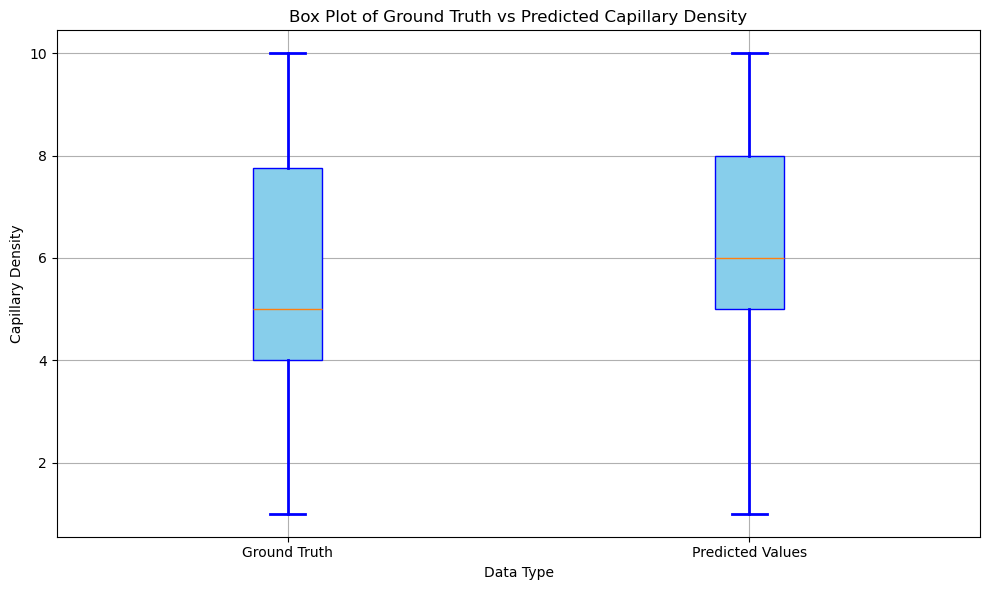

In [17]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data for box plot (convert dictionary values to lists)
ground_truth_values = list(ground_truth_sorted.values())
predicted_values_values = list(predicted_values_sorted.values())

# Combine both lists in a 2D array for box plot
data = [ground_truth_values, predicted_values_values]

plt.figure(figsize=(10, 6))
plt.boxplot(data, labels=['Ground Truth', 'Predicted Values'], patch_artist=True, boxprops=dict(facecolor='skyblue', color='blue'), 
            whiskerprops=dict(color='blue', linewidth=2), capprops=dict(color='blue', linewidth=2), 
            flierprops=dict(markerfacecolor='red', marker='o', markersize=5, linestyle='none'))
plt.xlabel('Data Type')
plt.ylabel('Capillary Density')
plt.title('Box Plot of Ground Truth vs Predicted Capillary Density')
plt.grid(True)
plt.tight_layout()
plt.show()


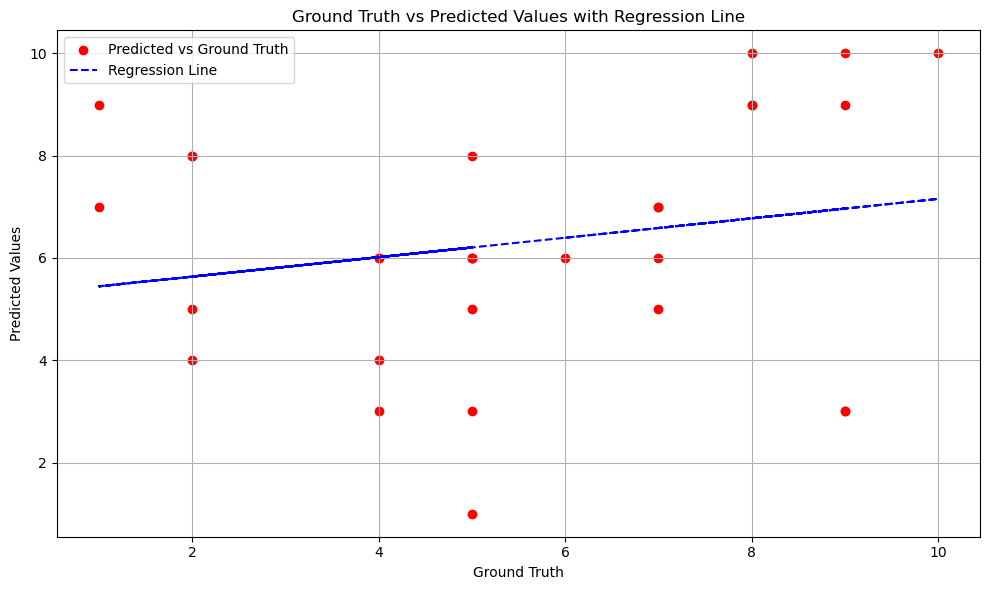

In [19]:
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt

# Convert the dictionary values to lists and reshape for linear regression
ground_truth_values = list(ground_truth_sorted.values())
predicted_values_values = list(predicted_values_sorted.values())

# Ensure data is in the right format (2D array for X and 1D array for y)
X = np.array(ground_truth_values).reshape(-1, 1)  # Feature (Ground Truth) reshaped to 2D
y = np.array(predicted_values_values)  # Target (Predicted Values)

# Fit a linear regression model
reg = LinearRegression().fit(X, y)
y_pred = reg.predict(X)

# Plot scatter and regression line
plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='r', label='Predicted vs Ground Truth')
plt.plot(X, y_pred, color='b', label='Regression Line', linestyle='--')
plt.xlabel('Ground Truth')
plt.ylabel('Predicted Values')
plt.title('Ground Truth vs Predicted Values with Regression Line')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


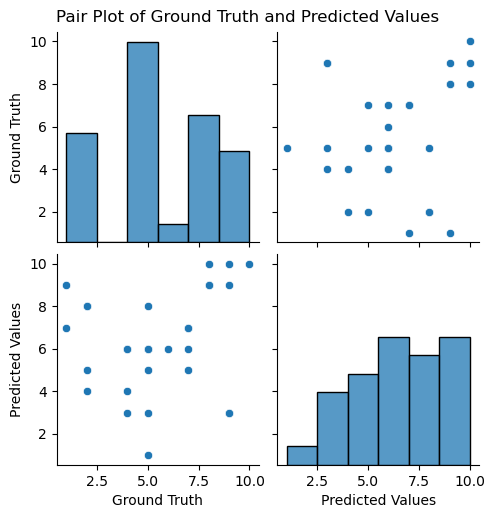

In [22]:
import seaborn as sns
import pandas as pd

# Create a DataFrame with ground truth and predicted values
df = pd.DataFrame({
    'Ground Truth': ground_truth_sorted.values(),
    'Predicted Values': predicted_values_sorted.values()
})

# Create a pairplot
sns.pairplot(df)
plt.suptitle('Pair Plot of Ground Truth and Predicted Values', y=1.02)
plt.show()


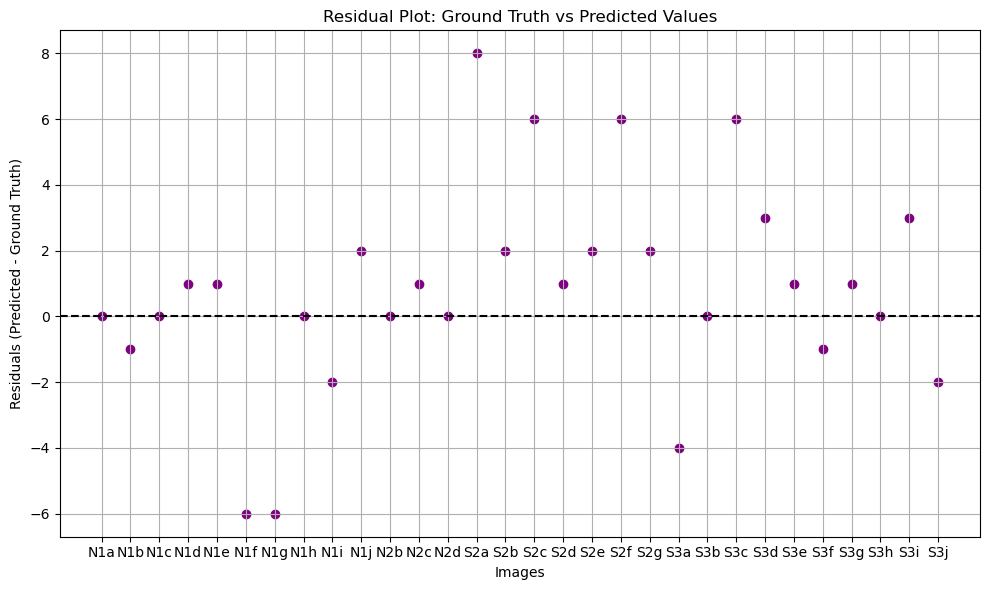

In [24]:
import numpy as np
import matplotlib.pyplot as plt

# Convert dict_values to lists or arrays for calculation
ground_truth_values = list(ground_truth_sorted.values())
predicted_values_values = list(predicted_values_sorted.values())

# Calculate residuals (Predicted - Ground Truth)
residuals = np.array(predicted_values_values) - np.array(ground_truth_values)

# Plot residuals
plt.figure(figsize=(10, 6))
plt.scatter(ground_truth_sorted.keys(), residuals, color='purple')
plt.axhline(y=0, color='black', linestyle='--')
plt.xlabel('Images')
plt.ylabel('Residuals (Predicted - Ground Truth)')
plt.title('Residual Plot: Ground Truth vs Predicted Values')
plt.grid(True)
plt.tight_layout()
plt.show()


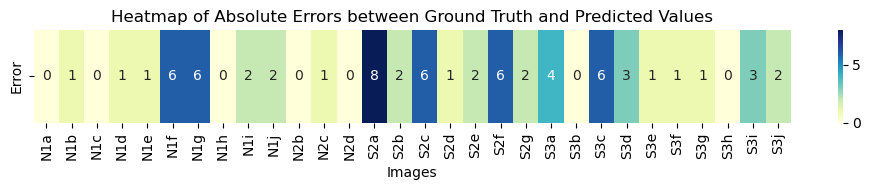

In [26]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Convert dict_values to lists for calculation
ground_truth_values = list(ground_truth_sorted.values())
predicted_values_values = list(predicted_values_sorted.values())

# Calculate absolute errors
absolute_errors = np.abs(np.array(predicted_values_values) - np.array(ground_truth_values))

# Create a heatmap (reshaped for proper visualization)
error_matrix = np.reshape(absolute_errors, (1, -1))  # Reshaping for heatmap display

# Plot the heatmap
plt.figure(figsize=(10, 2))
sns.heatmap(error_matrix, annot=True, cmap='YlGnBu', cbar=True, xticklabels=ground_truth_sorted.keys(), yticklabels=['Error'])
plt.title('Heatmap of Absolute Errors between Ground Truth and Predicted Values')
plt.xlabel('Images')
plt.tight_layout()
plt.show()
